# Deep Learning Watermark Detection & Removal

This notebook implements watermark detection and removal using:
1. **U-Net**: Semantic segmentation to predict watermark masks
2. **OpenCV Inpainting**: Traditional algorithms to remove watermarks using the predicted mask

Dataset: 1,850 matching pairs of watermarked/non-watermarked images

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import cv2

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cpu


## Load Dataset

In [2]:
from matching_pairs_list import matching_pairs

print(f"Total matching pairs: {len(matching_pairs)}")

train_pairs, test_pairs = train_test_split(matching_pairs, test_size=0.15, random_state=42)
train_pairs, val_pairs = train_test_split(train_pairs, test_size=0.15, random_state=42)

print(f"Train: {len(train_pairs)} pairs")
print(f"Validation: {len(val_pairs)} pairs")
print(f"Test: {len(test_pairs)} pairs")

Total matching pairs: 1850
Train: 1336 pairs
Validation: 236 pairs
Test: 278 pairs


## Dataset Class

In [3]:
class WatermarkDataset(Dataset):
    """
    Dataset for watermark detection.
    Returns: watermarked image, clean image, and watermark mask
    """
    def __init__(self, pairs, root_dir, img_size=256):
        self.pairs = pairs
        self.root_dir = Path(root_dir)
        self.img_size = img_size
        
        self.transform = transforms.Compose([
            transforms.Resize((img_size, img_size)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
        ])
        
        self.mask_transform = transforms.Compose([
            transforms.Resize((img_size, img_size)),
            transforms.ToTensor()
        ])
    
    def __len__(self):
        return len(self.pairs)
    
    def __getitem__(self, idx):
        pair = self.pairs[idx]
        watermark_path = self.root_dir / pair['watermark']
        clean_path = self.root_dir / pair['no_watermark']
        
        try:
            watermark_img = Image.open(watermark_path).convert('RGB')
            clean_img = Image.open(clean_path).convert('RGB')
            
            # Generate watermark mask by computing difference
            watermark_np = np.array(watermark_img.resize((self.img_size, self.img_size)))
            clean_np = np.array(clean_img.resize((self.img_size, self.img_size)))
            
            diff = np.abs(watermark_np.astype(float) - clean_np.astype(float))
            mask = (diff.mean(axis=2) > 10).astype(np.uint8) * 255
            mask_img = Image.fromarray(mask)
            
            watermark_tensor = self.transform(watermark_img)
            clean_tensor = self.transform(clean_img)
            mask_tensor = self.mask_transform(mask_img)
            
            return watermark_tensor, clean_tensor, mask_tensor
        
        except Exception as e:
            print(f"Error loading {pair['filename']}: {e}")
            return torch.zeros(3, self.img_size, self.img_size), \
                   torch.zeros(3, self.img_size, self.img_size), \
                   torch.zeros(1, self.img_size, self.img_size)

In [4]:
# Create datasets
IMG_SIZE = 256
BATCH_SIZE = 8
ROOT_DIR = '/Users/wesleykim/Classes/Columbia/COMS 4731/clear'

train_dataset = WatermarkDataset(train_pairs, root_dir=ROOT_DIR, img_size=IMG_SIZE)
val_dataset = WatermarkDataset(val_pairs, root_dir=ROOT_DIR, img_size=IMG_SIZE)
test_dataset = WatermarkDataset(test_pairs, root_dir=ROOT_DIR, img_size=IMG_SIZE)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

print(f"Train batches: {len(train_loader)}")
print(f"Val batches: {len(val_loader)}")
print(f"Test batches: {len(test_loader)}")

# Save a FIXED test batch for consistent visualizations across all examples
fixed_test_batch = next(iter(test_loader))
fixed_watermark_imgs, fixed_clean_imgs, fixed_mask_imgs = fixed_test_batch

Train batches: 167
Val batches: 30
Test batches: 35


## Visualize Sample Data

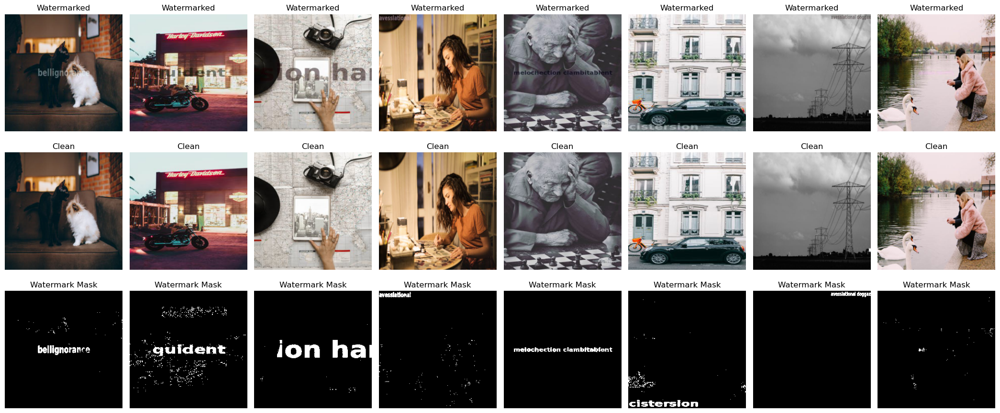

In [5]:
fig, axes = plt.subplots(3, 8, figsize=(21, 9))
for i in range(8):
    fixed_watermark_img = fixed_watermark_imgs[i].cpu().permute(1, 2, 0).numpy() * 0.5 + 0.5
    fixed_clean_img = fixed_clean_imgs[i].cpu().permute(1, 2, 0).numpy() * 0.5 + 0.5
    fixed_mask_img = fixed_mask_imgs[i].cpu().squeeze().numpy()
    
    axes[0, i].imshow(fixed_watermark_img)
    axes[0, i].set_title('Watermarked')
    axes[0, i].axis('off')
    
    axes[1, i].imshow(fixed_clean_img)
    axes[1, i].set_title('Clean')
    axes[1, i].axis('off')
    
    axes[2, i].imshow(fixed_mask_img, cmap='gray')
    axes[2, i].set_title('Watermark Mask')
    axes[2, i].axis('off')

plt.tight_layout()
plt.show()

## U-Net Architecture for Watermark Segmentation

In [6]:
class DoubleConv(nn.Module):
    """(Conv => BN => ReLU) * 2"""
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
    
    def forward(self, x):
        return self.double_conv(x)


class UNet(nn.Module):
    """U-Net for watermark segmentation"""
    def __init__(self, in_channels=3, out_channels=1):
        super().__init__()
        
        # Encoder
        self.enc1 = DoubleConv(in_channels, 64)
        self.pool1 = nn.MaxPool2d(2)
        self.enc2 = DoubleConv(64, 128)
        self.pool2 = nn.MaxPool2d(2)
        self.enc3 = DoubleConv(128, 256)
        self.pool3 = nn.MaxPool2d(2)
        self.enc4 = DoubleConv(256, 512)
        self.pool4 = nn.MaxPool2d(2)
        
        # Bottleneck
        self.bottleneck = DoubleConv(512, 1024)
        
        # Decoder
        self.upconv4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec4 = DoubleConv(1024, 512)
        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = DoubleConv(512, 256)
        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = DoubleConv(256, 128)
        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = DoubleConv(128, 64)
        
        # Output
        self.out = nn.Conv2d(64, out_channels, kernel_size=1)
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, x):
        enc1 = self.enc1(x)
        enc2 = self.enc2(self.pool1(enc1))
        enc3 = self.enc3(self.pool2(enc2))
        enc4 = self.enc4(self.pool3(enc3))
        
        bottleneck = self.bottleneck(self.pool4(enc4))
        
        dec4 = self.upconv4(bottleneck)
        dec4 = torch.cat([dec4, enc4], dim=1)
        dec4 = self.dec4(dec4)
        
        dec3 = self.upconv3(dec4)
        dec3 = torch.cat([dec3, enc3], dim=1)
        dec3 = self.dec3(dec3)
        
        dec2 = self.upconv2(dec3)
        dec2 = torch.cat([dec2, enc2], dim=1)
        dec2 = self.dec2(dec2)
        
        dec1 = self.upconv1(dec2)
        dec1 = torch.cat([dec1, enc1], dim=1)
        dec1 = self.dec1(dec1)
        
        return self.sigmoid(self.out(dec1))

In [7]:
# Initialize U-Net
unet = UNet(in_channels=3, out_channels=1).to(device)
print(f"U-Net parameters: {sum(p.numel() for p in unet.parameters()):,}")

U-Net parameters: 31,043,521


## Training Function

In [8]:
def train_unet(model, train_loader, val_loader, epochs=20, lr=0.001):
    """Train U-Net for watermark segmentation using BCE loss."""
    criterion = nn.BCELoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=3, factor=0.5)
    
    train_losses, val_losses = [], []
    
    for epoch in range(epochs):
        # Training
        model.train()
        train_loss = 0.0
        for watermark_imgs, _, mask_imgs in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs} [Train]"):
            watermark_imgs = watermark_imgs.to(device)
            mask_imgs = mask_imgs.to(device)
            
            optimizer.zero_grad()
            pred_masks = model(watermark_imgs)
            loss = criterion(pred_masks, mask_imgs)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
        
        train_loss /= len(train_loader)
        train_losses.append(train_loss)
        
        # Validation
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for watermark_imgs, _, mask_imgs in tqdm(val_loader, desc=f"Epoch {epoch+1}/{epochs} [Val]"):
                watermark_imgs = watermark_imgs.to(device)
                mask_imgs = mask_imgs.to(device)
                pred_masks = model(watermark_imgs)
                val_loss += criterion(pred_masks, mask_imgs).item()
        
        val_loss /= len(val_loader)
        val_losses.append(val_loss)
        
        scheduler.step(val_loss)
        print(f"Epoch {epoch+1}/{epochs} - Train: {train_loss:.4f}, Val: {val_loss:.4f}")
    
    return train_losses, val_losses

## Train U-Net

In [9]:
print("Training U-Net for Watermark Segmentation...")
unet_train_losses, unet_val_losses = train_unet(unet, train_loader, val_loader, epochs=20, lr=0.001)

Training U-Net for Watermark Segmentation...


Epoch 1/20 [Val]: 100%|██████████| 30/30 [00:33<00:00,  1.12s/it]


Epoch 1/20 - Train: 0.2241, Val: 0.1453


Epoch 2/20 [Val]: 100%|██████████| 30/30 [00:33<00:00,  1.12s/it]


Epoch 2/20 - Train: 0.1247, Val: 0.1252


Epoch 3/20 [Val]: 100%|██████████| 30/30 [00:33<00:00,  1.11s/it]


Epoch 3/20 - Train: 0.1179, Val: 0.1249


Epoch 4/20 [Val]: 100%|██████████| 30/30 [00:35<00:00,  1.18s/it]


Epoch 4/20 - Train: 0.1112, Val: 0.1230


Epoch 5/20 [Val]: 100%|██████████| 30/30 [00:33<00:00,  1.12s/it]


Epoch 5/20 - Train: 0.1067, Val: 0.1346


Epoch 6/20 [Val]: 100%|██████████| 30/30 [00:33<00:00,  1.11s/it]


Epoch 6/20 - Train: 0.1001, Val: 0.1068


Epoch 7/20 [Val]: 100%|██████████| 30/30 [00:32<00:00,  1.08s/it]


Epoch 7/20 - Train: 0.0944, Val: 0.1030


Epoch 8/20 [Val]: 100%|██████████| 30/30 [00:32<00:00,  1.08s/it]


Epoch 8/20 - Train: 0.0911, Val: 0.1012


Epoch 9/20 [Val]: 100%|██████████| 30/30 [00:35<00:00,  1.17s/it]


Epoch 9/20 - Train: 0.0871, Val: 0.0945


Epoch 10/20 [Val]: 100%|██████████| 30/30 [00:33<00:00,  1.11s/it]


Epoch 10/20 - Train: 0.0837, Val: 0.0965


Epoch 11/20 [Val]: 100%|██████████| 30/30 [00:33<00:00,  1.10s/it]


Epoch 11/20 - Train: 0.0832, Val: 0.0935


Epoch 12/20 [Val]: 100%|██████████| 30/30 [00:34<00:00,  1.17s/it]


Epoch 12/20 - Train: 0.0784, Val: 0.0955


Epoch 13/20 [Val]: 100%|██████████| 30/30 [00:33<00:00,  1.12s/it]


Epoch 13/20 - Train: 0.0772, Val: 0.0910


Epoch 14/20 [Val]: 100%|██████████| 30/30 [00:36<00:00,  1.22s/it]


Epoch 14/20 - Train: 0.0740, Val: 0.0900


Epoch 15/20 [Val]: 100%|██████████| 30/30 [00:33<00:00,  1.13s/it]


Epoch 15/20 - Train: 0.0723, Val: 0.0864


Epoch 16/20 [Val]: 100%|██████████| 30/30 [00:33<00:00,  1.13s/it]


Epoch 16/20 - Train: 0.0706, Val: 0.0858


Epoch 17/20 [Val]: 100%|██████████| 30/30 [00:33<00:00,  1.11s/it]


Epoch 17/20 - Train: 0.0687, Val: 0.0936


Epoch 18/20 [Val]: 100%|██████████| 30/30 [00:33<00:00,  1.12s/it]


Epoch 18/20 - Train: 0.0678, Val: 0.0804


Epoch 19/20 [Val]: 100%|██████████| 30/30 [00:33<00:00,  1.12s/it]


Epoch 19/20 - Train: 0.0660, Val: 0.0811


Epoch 20/20 [Val]: 100%|██████████| 30/30 [00:33<00:00,  1.12s/it]

Epoch 20/20 - Train: 0.0629, Val: 0.0782


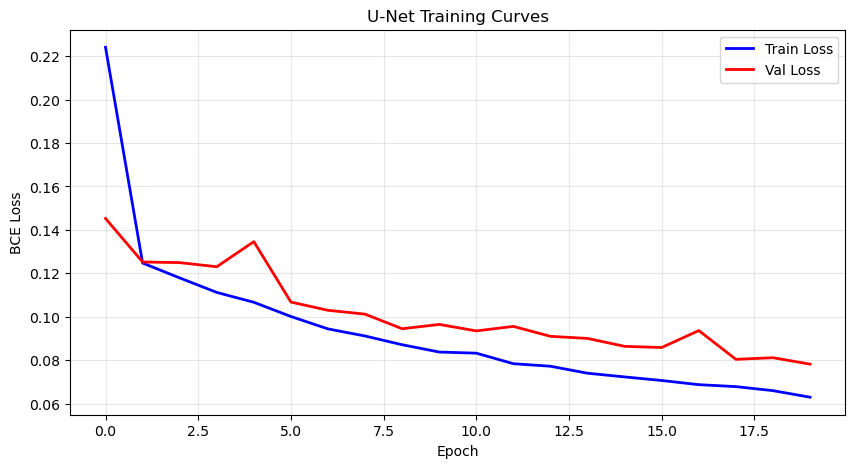

In [10]:
# Plot training curves
plt.figure(figsize=(10, 5))
plt.plot(unet_train_losses, 'b-', label='Train Loss', linewidth=2)
plt.plot(unet_val_losses, 'r-', label='Val Loss', linewidth=2)
plt.xlabel('Epoch')
plt.ylabel('BCE Loss')
plt.title('U-Net Training Curves')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

## U-Net Segmentation Visualization

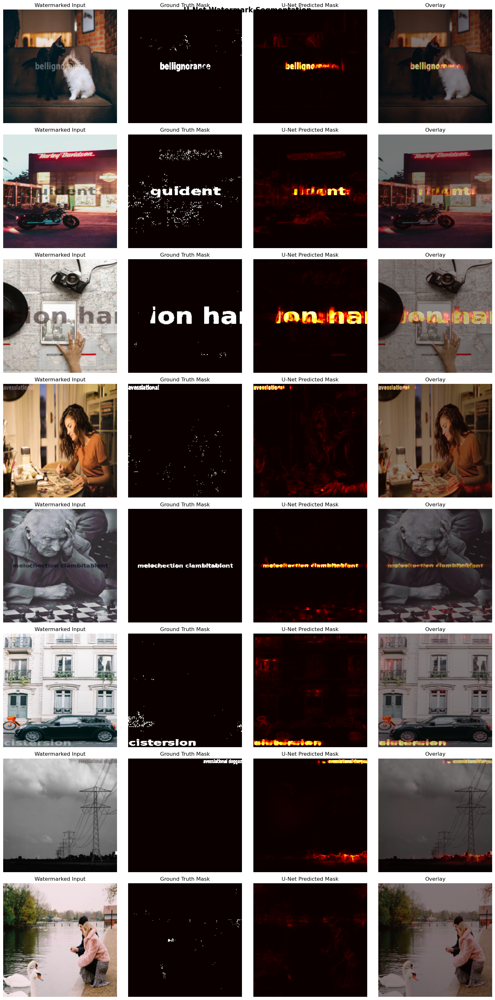

In [11]:
def visualize_unet_segmentation(model, watermark_imgs, mask_imgs, num_samples):
    """Visualize U-Net segmentation results using fixed test batch."""
    model.eval()
    
    with torch.no_grad():
        watermark_imgs_device = watermark_imgs.to(device)
        pred_masks = model(watermark_imgs_device)
        pred_masks = pred_masks.cpu()
        
        fig, axes = plt.subplots(num_samples, 4, figsize=(16, 4*num_samples))
        
        for i in range(num_samples):
            watermark = np.clip(watermark_imgs[i].permute(1, 2, 0).numpy() * 0.5 + 0.5, 0, 1)
            mask = mask_imgs[i].squeeze().numpy()
            pred_mask = pred_masks[i].squeeze().numpy()
            
            axes[i, 0].imshow(watermark)
            axes[i, 0].set_title('Watermarked Input')
            axes[i, 0].axis('off')
            
            axes[i, 1].imshow(mask, cmap='hot', vmin=0, vmax=1)
            axes[i, 1].set_title('Ground Truth Mask')
            axes[i, 1].axis('off')
            
            axes[i, 2].imshow(pred_mask, cmap='hot', vmin=0, vmax=1)
            axes[i, 2].set_title('U-Net Predicted Mask')
            axes[i, 2].axis('off')
            
            axes[i, 3].imshow(watermark)
            axes[i, 3].imshow(pred_mask, cmap='hot', alpha=0.5, vmin=0, vmax=1)
            axes[i, 3].set_title('Overlay')
            axes[i, 3].axis('off')
        
        plt.suptitle('U-Net Watermark Segmentation', fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.show()

visualize_unet_segmentation(unet, fixed_watermark_imgs, fixed_mask_imgs, 8)

## U-Net Segmentation Metrics

In [12]:
def evaluate_unet_segmentation(model, test_loader):
    """Evaluate U-Net with segmentation metrics."""
    model.eval()
    all_preds, all_targets = [], []
    
    with torch.no_grad():
        for watermark_imgs, _, mask_imgs in tqdm(test_loader, desc="Evaluating U-Net"):
            watermark_imgs = watermark_imgs.to(device)
            pred_masks = model(watermark_imgs)
            pred_binary = (pred_masks > 0.5).float()
            
            all_preds.append(pred_binary.cpu().numpy().flatten())
            all_targets.append(mask_imgs.numpy().flatten())
    
    all_preds = np.concatenate(all_preds)
    all_targets = np.concatenate(all_targets)
    
    accuracy = accuracy_score(all_targets, all_preds)
    precision = precision_score(all_targets, all_preds, zero_division=0)
    recall = recall_score(all_targets, all_preds, zero_division=0)
    f1 = f1_score(all_targets, all_preds, zero_division=0)
    
    TN = np.sum((all_preds == 0) & (all_targets == 0))
    FP = np.sum((all_preds == 1) & (all_targets == 0))
    specificity = TN / (TN + FP) if (TN + FP) > 0 else 0
    
    return accuracy, precision, recall, f1, specificity

accuracy, precision, recall, f1, specificity = evaluate_unet_segmentation(unet, test_loader)


print("\nU-NET SEGMENTATION METRICS")
print(f"Accuracy:    {accuracy:.4f}  (pixel-level correctness)")
print(f"Precision:   {precision:.4f}  (correct watermark detections)")
print(f"Recall:      {recall:.4f}  (watermark pixels found)")
print(f"F1 Score:    {f1:.4f}  (harmonic mean of P & R)")
print(f"Specificity: {specificity:.4f}  (correct non-watermark rejections)")


Evaluating U-Net: 100%|██████████| 35/35 [00:39<00:00,  1.14s/it]



U-NET SEGMENTATION METRICS
Accuracy:    0.9788  (pixel-level correctness)
Precision:   0.8179  (correct watermark detections)
Recall:      0.5221  (watermark pixels found)
F1 Score:    0.6374  (harmonic mean of P & R)
Specificity: 0.9957  (correct non-watermark rejections)


## Watermark Removal using U-Net Mask + Inpainting

Now we use the U-Net predicted mask with OpenCV inpainting to remove watermarks.

In [13]:
def remove_watermark_with_mask(watermarked_img, mask, method='inpaint_telea', inpaint_radius=5):
    """
    Remove watermark using OpenCV inpainting.
    """
    img_uint8 = (watermarked_img * 255).astype(np.uint8)
    mask_uint8 = (mask * 255).astype(np.uint8)
    
    _, mask_binary = cv2.threshold(mask_uint8, 127, 255, cv2.THRESH_BINARY)
    kernel = np.ones((3, 3), np.uint8)
    mask_dilated = cv2.dilate(mask_binary, kernel, iterations=2)
    
    if method == 'inpaint_telea':
        result = cv2.inpaint(img_uint8, mask_dilated, inpaintRadius=inpaint_radius, flags=cv2.INPAINT_TELEA)
    else:
        result = cv2.inpaint(img_uint8, mask_dilated, inpaintRadius=inpaint_radius, flags=cv2.INPAINT_NS)
    
    return result.astype(np.float32) / 255.0


def unet_removal_pipeline(model, watermarked_tensor, method='inpaint_telea', threshold=0.5):
    """
    Complete pipeline: U-Net mask prediction -> Inpainting removal.
    """
    model.eval()
    
    with torch.no_grad():
        pred_mask = model(watermarked_tensor.to(device))
        pred_mask_np = pred_mask.cpu().squeeze().numpy()
        pred_mask_binary = (pred_mask_np > threshold).astype(np.float32)
        
        watermarked_np = watermarked_tensor.cpu().squeeze().permute(1, 2, 0).numpy() * 0.5 + 0.5
        watermarked_np = np.clip(watermarked_np, 0, 1)
        
        cleaned_img = remove_watermark_with_mask(watermarked_np, pred_mask_binary, method=method)
    
    return cleaned_img, pred_mask_np, pred_mask_binary

## Visualize Watermark Removal Results

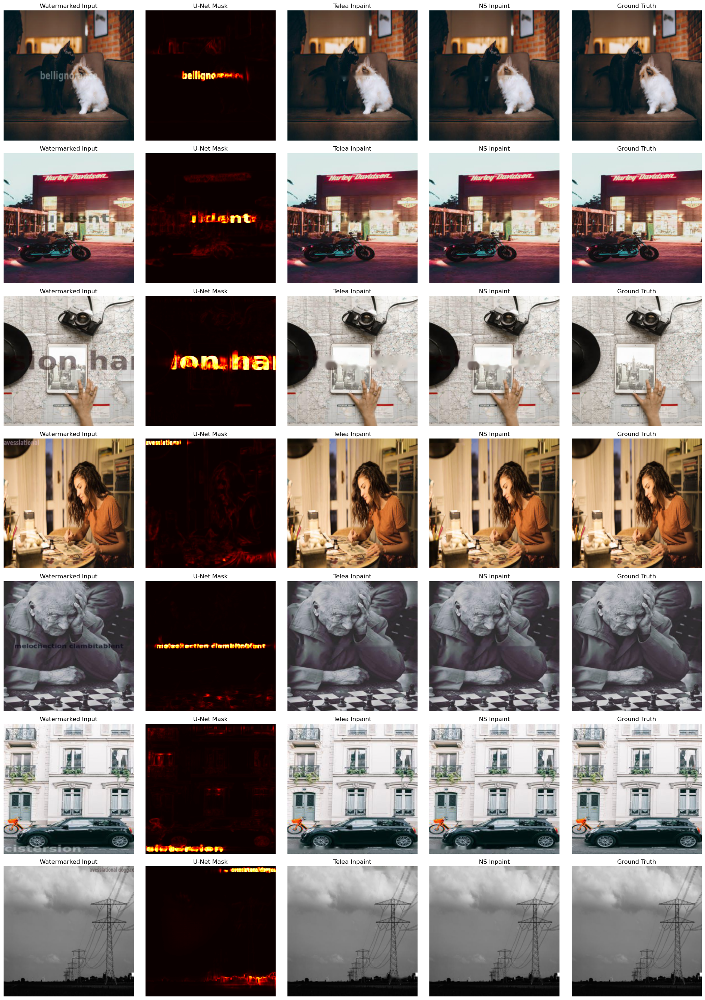

In [17]:
def visualize_removal_results(model, watermark_imgs, clean_imgs, num_samples=5):
    """Visualize U-Net mask + inpainting removal results using fixed test batch."""
    model.eval()
    
    with torch.no_grad():
        fig, axes = plt.subplots(num_samples, 5, figsize=(20, 4*num_samples))
        
        for i in range(num_samples):
            watermark_tensor = watermark_imgs[i:i+1]
            
            cleaned_telea, pred_mask, _ = unet_removal_pipeline(model, watermark_tensor, method='inpaint_telea')
            cleaned_ns, _, _ = unet_removal_pipeline(model, watermark_tensor, method='inpaint_ns')
            
            watermarked_np = np.clip(watermark_tensor.squeeze().permute(1, 2, 0).numpy() * 0.5 + 0.5, 0, 1)
            clean_np = np.clip(clean_imgs[i].permute(1, 2, 0).numpy() * 0.5 + 0.5, 0, 1)
            
            axes[i, 0].imshow(watermarked_np)
            axes[i, 0].set_title('Watermarked Input')
            axes[i, 0].axis('off')
            
            axes[i, 1].imshow(pred_mask, cmap='hot', vmin=0, vmax=1)
            axes[i, 1].set_title('U-Net Mask')
            axes[i, 1].axis('off')
            
            axes[i, 2].imshow(cleaned_telea)
            axes[i, 2].set_title('Telea Inpaint')
            axes[i, 2].axis('off')
            
            axes[i, 3].imshow(cleaned_ns)
            axes[i, 3].set_title('NS Inpaint')
            axes[i, 3].axis('off')
            
            axes[i, 4].imshow(clean_np)
            axes[i, 4].set_title('Ground Truth')
            axes[i, 4].axis('off')
        
        # plt.suptitle('U-Net Mask + Inpainting Watermark Removal', fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.show()

visualize_removal_results(unet, fixed_watermark_imgs, fixed_clean_imgs, num_samples=7)

## Evaluate Inpainting Removal

In [15]:
def evaluate_inpainting_removal(model, test_loader, method='inpaint_telea'):
    """Evaluate inpainting-based watermark removal."""
    model.eval()
    total_psnr, total_mse, total_l1 = 0, 0, 0
    num_samples = 0
    
    with torch.no_grad():
        for watermark_imgs, clean_imgs, _ in tqdm(test_loader, desc=f"Evaluating {method}"):
            for i in range(len(watermark_imgs)):
                watermark_tensor = watermark_imgs[i:i+1]
                clean_np = np.clip(clean_imgs[i].permute(1, 2, 0).numpy() * 0.5 + 0.5, 0, 1)
                
                cleaned, _, _ = unet_removal_pipeline(model, watermark_tensor, method=method)
                
                mse = np.mean((cleaned - clean_np) ** 2)
                l1 = np.mean(np.abs(cleaned - clean_np))
                psnr = 10 * np.log10(1.0 / mse) if mse > 0 else 100
                
                total_psnr += psnr
                total_mse += mse
                total_l1 += l1
                num_samples += 1
    
    return total_psnr/num_samples, total_mse/num_samples, total_l1/num_samples

# Evaluate both methods
print("WATERMARK REMOVAL EVALUATION (U-Net Mask + Inpainting)".center(70))

psnr_telea, mse_telea, l1_telea = evaluate_inpainting_removal(unet, test_loader, method='inpaint_telea')
psnr_ns, mse_ns, l1_ns = evaluate_inpainting_removal(unet, test_loader, method='inpaint_ns')

print(f"{'Method':<25} {'PSNR (dB)':<15} {'MSE':<15} {'L1':<15}")
print(f"{'Telea Inpainting':<25} {psnr_telea:<15.2f} {mse_telea:<15.4f} {l1_telea:<15.4f}")
print(f"{'Navier-Stokes Inpaint':<25} {psnr_ns:<15.2f} {mse_ns:<15.4f} {l1_ns:<15.4f}")


        WATERMARK REMOVAL EVALUATION (U-Net Mask + Inpainting)        


Evaluating inpaint_ns: 100%|██████████| 35/35 [00:51<00:00,  1.46s/it]

Method                    PSNR (dB)       MSE             L1             
Telea Inpainting          34.20           0.0017          0.0108         
Navier-Stokes Inpaint     34.12           0.0017          0.0108         
